---
> * **ELGHAZI SOUFIANE**
---

<h1 style='color:olive' align='center'>YOLO : You Only Look Once: Unified, Real-Time Object Detection</h1>

<div style="text-align:center;">
    <img src="https://datacorner.fr/wp-content/uploads/2021/09/yolo2.jpg" alt="image1">
</div>

<h2 style='color:orangered' align='center'>Introduction </h2>

* <h3 style='color:purple'>Contexte </h3>

<div style="text-align: justify; font-weight:bold;">

La détection d'objets en vision par ordinateur est un domaine crucial pour de nombreuses applications, allant de la sécurité à la santé en passant par l'agriculture. Parmi les différentes méthodes de détection d'objets, YOLO (You Only Look Once) a émergé comme une approche rapide et précise. Ce notebook vise à explorer le fonctionnement de YOLO à travers une démonstration pratique de détection de masques, suivi d'une analyse de la détection de weed corp.
 </div>

* <h3 style='color:purple'>Yolo comme algo de détection d'objet </h3>

<div style="text-align: justify; font-weight:bold;">
L'algorithme YOLO (You Only Look Once) a révolutionné le domaine de la détection d'objets en vision par ordinateur grâce à son approche novatrice et sa performance exceptionnelle. Contrairement aux méthodes traditionnelles, YOLO excelle en termes de vitesse et de précision, faisant de lui un choix privilégié pour une multitude d'applications.
 </div>

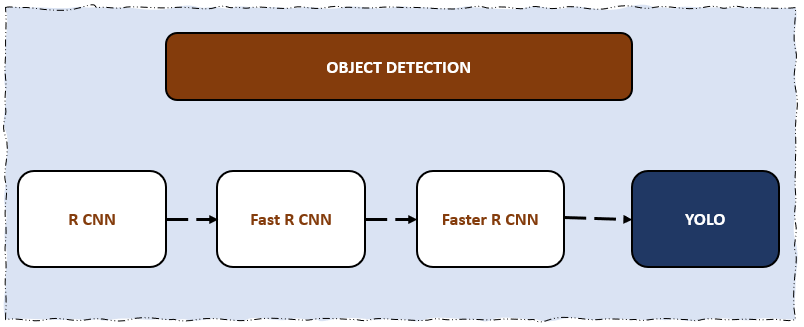

<div style="text-align: justify; font-weight:bold;">
Ces méthodes de détection d'objets, telles que R-CNN, Fast R-CNN, Faster R-CNN, et YOLO, représentent différentes étapes de l'évolution des architectures. Alors que R-CNN a posé les bases avec l'introduction de propositions de régions, Fast R-CNN a optimisé la vitesse en intégrant cette génération de propositions dans le réseau. Faster R-CNN a poussé cette intégration plus loin avec l'introduction du Region Proposal Network (RPN), éliminant le besoin d'étapes externes. D'un autre côté, YOLO a révolutionné le paradigme en effectuant la détection en une seule passe, démontrant une efficacité remarquable en termes de rapidité et de précision. Ces approches représentent des jalons dans le développement de solutions de détection d'objets, chacune apportant des améliorations significatives à son prédécesseur.
 </div>

* <h3 style='color:purple'>Objectif de Notebook </h3>

<div style="text-align: justify; font-weight:bold;">

Nous débuterons par une démonstration simple de détection de masques pour illustrer l'utilité de YOLO. Ensuite, nous plongerons dans une explication détaillée des étapes clés de YOLO, mettant en lumière son efficacité et ses applications diverses. Enfin, nous analyserons un cas concret de détection de weed corp à l'aide d'un code existant.

Ce notebook est conçu pour offrir une compréhension approfondie de YOLO et démontrer son potentiel à travers des exemples pratiques.
</div>

<h2 style='color:orangered' align='center'>Plan </h2>

<div style="text-align: justify; font-weight:bold;">
    
<p style="color:brown;">1. Introduction</p>
   - Contexte et importance de la détection d'objets en vision par ordinateur.<br>
   - Présentation de YOLO comme un algorithme de détection d'objets particulièrement efficace.<br>
   - Objectif du notebook : comprendre le fonctionnement de YOLO à travers une démonstration de détection de masques, suivi d'une analyse de la détection de weed corp.<br>
<br><br>
    
<p style="color:brown;">2.Demo:   Démonstration de Détection de Masques (Cas Simple) </p>
   - Importation des bibliothèques nécessaires.<br>
   - Génération des masques.<br>
<br><br>
    
<p style="color:brown;">3.Théorie:   Compréhension Approfondie de YOLO</p>
   - Explication des étapes clés de YOLO (Découpage de l'image, Prédiction des boîtes englobantes, Prédiction de la classe, Confiance, Suppression des non-maximaux).<br>
   - Présentation des versions majeures de YOLO (YOLOv1, YOLOv2, YOLOv3, etc.).<br>
   - Discussion sur les avantages de YOLO en termes de vitesse et de précision.<br>
<br><br>
    
<p style="color:brown;">4. Pratique:   Analyse de la Détection de Weed Corp</p>
   - Présentation du cas d'utilisation de la détection de weed corp.<br>
   - Importation du code existant de détection de weed corp..<br>
   - Exécution du code sur des échantillons d'images de weed corp.<br>
   - Analyse des résultats et des performances..<br>
<br><br>
    
<p style="color:brown;">5. Conclusion</p>
   - Récapitulation des points clés abordés dans le notebook..<br>
   - Importance de YOLO dans la détection d'objets et ses applications variées.<br>
<br><br>
    
<p style="color:brown;">6. Références</p>
   - Listes des références utilisées pour la création du notebook.<br>
<br><br>
</div>


<h2 style='color:orangered' align='center'>Demo </h2>

<div style="text-align: justify; font-weight:bold; color:#000020">
Dans ce notebook, je vais vous guider à travers une exploration de l'algorithme de détection d'objets YOLO (You Only Look Once). Nous débuterons par une démonstration pratique de la puissance de YOLO dans la détection de masques, illustrant ainsi ses capacités fondamentales. Vous découvrirez les étapes essentielles du processus de détection d'objets, allant du découpage de l'image à la suppression des boîtes non-maximaux, tout en mettant en évidence la vitesse et la précision caractéristiques de YOLO. Par la suite, nous plongerons dans une analyse approfondie de la détection de weed corp, un cas concret qui met en lumière l'applicabilité de YOLO dans des contextes variés. Ce notebook vise à vous fournir une compréhension claire et concrète de YOLO, enrichie par des démonstrations pratiques et une application réelle de détection d'objets.
 </div>

<h3 style='color:purple' >Importation des bibliothèques et déclaration des fonctions </h3>

In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches
import pylab as pl
from PIL import Image

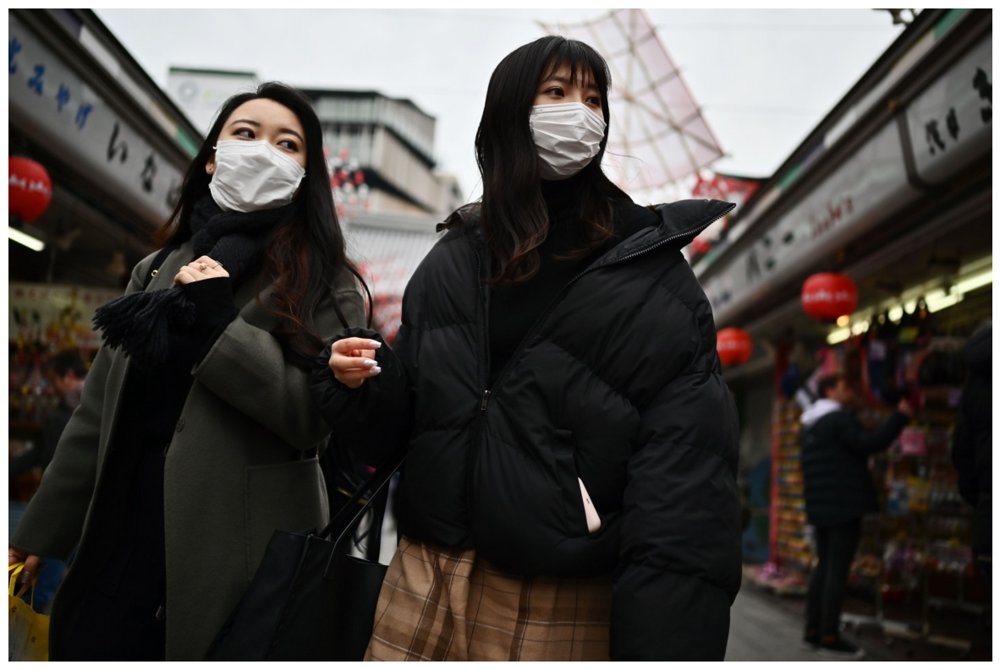

In [2]:
img0 = "/kaggle/input/face-mask-dataset-yolo/dataset/images/train/-I1-MS09uaqsLdGTFkgnS0Rcg1mmPyAj95ySg_eckoM.jpeg"
_ = plt.figure(figsize = (15,20))
_ = plt.axis('off')
_ = plt.imshow(mpimg.imread(img0))

In [3]:
directory = '/kaggle/input/face-mask-dataset-yolo/dataset/images/train'

imagepath=[]
imagefile=[]
boxset=[]
boxfile=[]

for im in os.listdir(directory):
    if im[-5:]=='.jpeg':
        path=os.path.join(directory,im)
        imagepath+=[path]
        imagefile+=[im]
    elif im[-4:]=='.jpg':
        path=os.path.join(directory,im)
        imagepath+=[path]
        imagefile+=[im]
        
for im in imagefile:
    if im[-5:]=='.jpeg':
        bx=im[0:-5]+'.txt'
        path=os.path.join(directory,bx)
        bxdata=np.loadtxt(path)
        boxset+=[bxdata]
        boxfile+=[bx]
    elif im[-4:]=='.jpg':
        bx=im[0:-4]+'.txt'
        path=os.path.join(directory,bx)
        bxdata=np.loadtxt(path)
        boxset+=[bxdata]
        boxfile+=[bx]    

print(imagefile[0:5])
print(boxfile[0:5])

['1580286580_5bab.jpg', 'DENn-KMXoAEtKHy.jpg', '1140-travelers-at-hong-kong-airport.jpg', 'coronavirus-bild.jpg', '920x920.jpg']
['1580286580_5bab.txt', 'DENn-KMXoAEtKHy.txt', '1140-travelers-at-hong-kong-airport.txt', 'coronavirus-bild.txt', '920x920.txt']


In [4]:
print(len(boxset))
print(len(imagepath))

692
692


In [5]:
def draw_bbox2(num0):
    
    img0=imagepath[num0]
    box0=boxset[num0]
    im = Image.open(img0)
    W,H = im.size
    print(im.size)  
    _ = plt.figure(figsize = (15,20))
    _ = plt.axis('on')
    _ = plt.imshow(mpimg.imread(img0))   
    ax = plt.gca()
    ax.text(W*0.02,H*0.05,f'MASK',fontsize=20,color='yellow')
    ax.text(W*0.02,H*0.09,f'NO MASK',fontsize=20,color='red')
    
    if type(box0[0])==int:
        mk,x0,y0,w0,h0 = box0
        x=(x0-w0/2)*W
        y=(y0-h0/2)*H
        w=w0*W
        h=h0*H
        if mk==1:
            rect = patches.Rectangle((x,y),w,h,linewidth=2,edgecolor='yellow',fill = False)
        elif mk==0:
            rect = patches.Rectangle((x,y),w,h,linewidth=2,edgecolor='red',fill = False)
        ax.add_patch(rect)
        plt.show
    else:
        for item in box0:
            mk,x0,y0,w0,h0 = item
            x=(x0-w0/2)*W
            y=(y0-h0/2)*H
            w=w0*W
            h=h0*H
            if mk==1:
                rect = patches.Rectangle((x,y),w,h,linewidth=2,edgecolor='yellow',fill = False)
            elif mk==0:
                rect = patches.Rectangle((x,y),w,h,linewidth=2,edgecolor='red',fill = False)            
            ax.add_patch(rect)
            plt.show

<h3 style='color:purple'>Génération des images contourées </h3>

235
(1920, 1277)


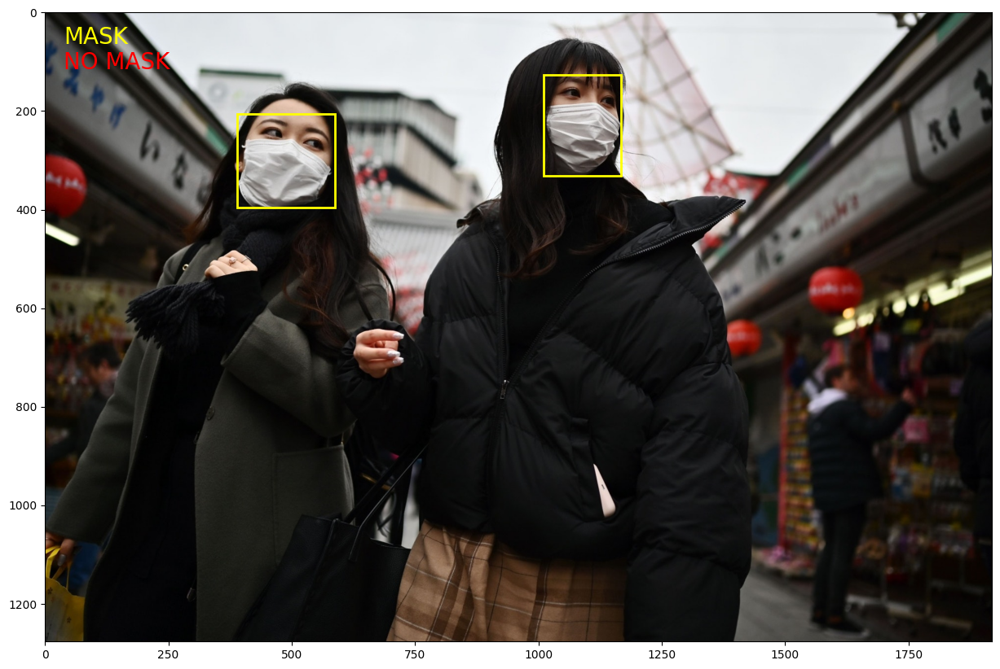

In [6]:
num0=0
for i in range(692):
    if imagepath[i]==img0:
        num0=i
        print(i)
draw_bbox2(num0)

(720, 566)


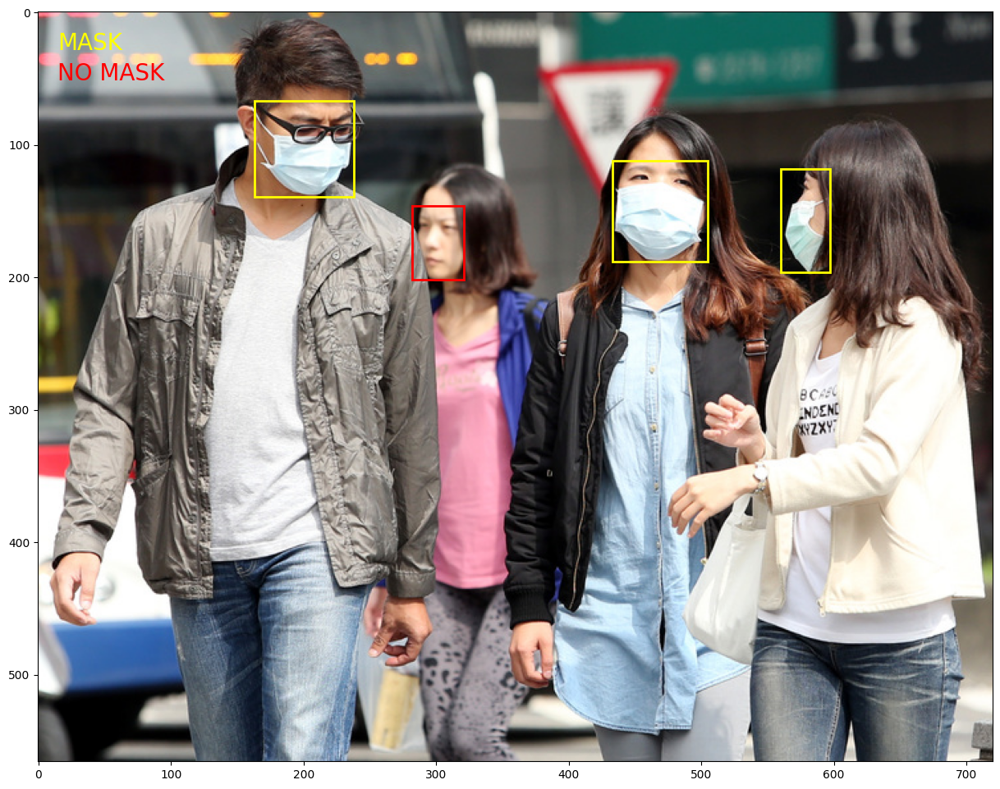

In [7]:
draw_bbox2(10)

(1024, 797)


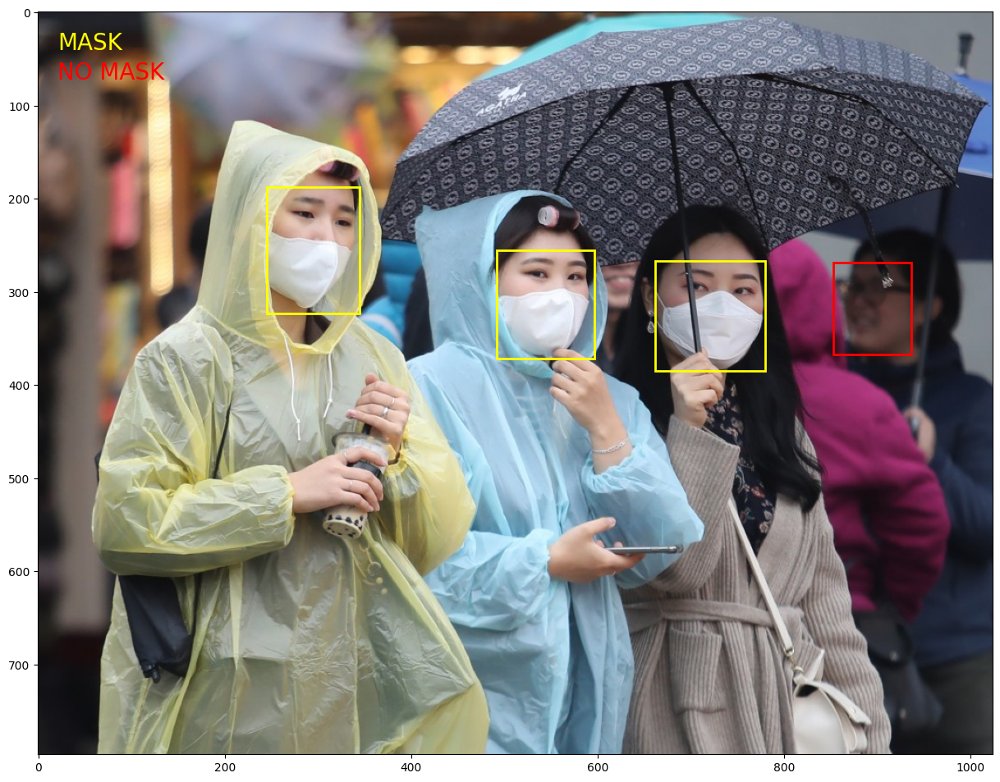

In [8]:
draw_bbox2(18)

<h2 style='color:orangered' align='center'>Théorie </h2>

* <h3 style='color:purple' >étapes clés de YOLO </h3>

<div style="text-align:center;">
    <img src="https://manalelaidouni.github.io/assets/img/pexels/YOLO_arch.png" alt="image3">
</div>

---
<div style="font-weight:bold">
    
<p style="color:olive">Découpage de l'image :</p> YOLO divise l'image en une grille de cellules. Chaque cellule est responsable de prédire les objets qui s'y trouvent.<br>

<p style="color:olive">Prédiction des boîtes englobantes :</p> Chaque cellule prédit un certain nombre de boîtes englobantes. Ces boîtes délimitent les régions où l'algorithme pense qu'un objet pourrait se trouver.<br>

<p style="color:olive">Prédiction de la classe :</p> Pour chaque boîte englobante prédite, YOLO prédit également la classe de l'objet qu'elle contient.<br>

<p style="color:olive">Confiance :</p> Chaque boîte englobante est associée à une valeur de confiance, indiquant la certitude de YOLO concernant la détection. Cela permet de filtrer les prédictions moins fiables.<br>

<p style="color:olive">Suppression des non-maximaux :</p> Pour éviter les duplications, une suppression des boîtes non-maximaux est effectuée. Cela signifie qu'après avoir filtré les détections avec une faible confiance, on ne conserve que la boîte avec la confiance la plus élevée parmi celles qui se chevauchent significativement.<br>
    
</div>

---

* <h3 style='color:purple' >Versions Majeurs </h3>

<div style="text-align:center;">
    <img src="https://learnopencv.com/wp-content/uploads/2023/01/evolution-of-yolo-models.png" alt="image4">
</div>

---
<div style="font-weight:bold">
    
    
<p style="color:olive">YOLOv1 :</p> Première version de YOLO, introduisant l'approche "You Only Look Once" pour la détection d'objets.<br>

<p style="color:olive">YOLOv2 (YOLO9000) :</p> Améliorations significatives, y compris la détection de plus de classes et l'introduction de l'apprentissage de regroupements.<br>

<p style="color:olive">YOLOv3 :</p> Optimisations architecturales, gestion des objets de petite taille, et prédiction à différentes échelles.<br>

<p style="color:olive">YOLOv4 :</p> Améliorations continues en termes de vitesse et de précision, introduisant des fonctionnalités avancées.<br>

<p style="color:olive">YOLOv5 :</p> Développement ultérieur par la communauté, avec des améliorations continues et une approche plus modulaire.<br>
    
</div>

---

* <h3 style='color:purple' >Avantages </h3>


<div style="text-align:center;">
    <img src="https://www.fpga-china.com/wp-content/uploads/2022/01/101643181369.png" alt="image5">
</div>

---
<div style="font-weight:bold">
    
<p style="color:olive">Vitesse :</p> YOLO excelle dans la détection d'objets en temps réel grâce à son approche de détection en une seule passe, éliminant la nécessité de plusieurs analyses de l'image.<br>

<p style="color:olive">Précision :</p> Malgré sa rapidité, YOLO maintient une précision élevée en prédiction des boîtes englobantes et des classes, offrant une détection détaillée des objets.<br>

<p style="color:olive">Évolutivité :</p> Les versions successives de YOLO montrent un engagement continu envers l'amélioration des performances, de la gestion des classes à l'optimisation architecturale, rendant YOLO adaptable à diverses applications et environnements.<br>
    
</div>

---

<h2 style='color:orangered' align='center'>Pratique: </h2>

* <h3 style='color:purple' >Intro </h3>

<div style="text-align: justify; font-weight:bold;">

Il faut se débarasser des mauvaises herbes qui sont des intrus indésirables dans le secteur agricole pour augmenter les rendements des cultures.Du coup Nous devons détecter la culture et les mauvaises herbes en utilisant le modèle YOLOv8.

Ici, nous pouvons télécharger l'ensemble de données en utilisant la fonction wget et décompresser le fichier téléchargé en utilisant la fonction unzip.
 </div>

In [9]:
!wget "https://s3-ap-southeast-1.amazonaws.com/he-public-data/Weed_Detection5a431d7.zip"

--2023-12-14 10:55:12--  https://s3-ap-southeast-1.amazonaws.com/he-public-data/Weed_Detection5a431d7.zip
Resolving s3-ap-southeast-1.amazonaws.com (s3-ap-southeast-1.amazonaws.com)... 52.219.132.126, 52.219.40.198, 52.219.128.10, ...
Connecting to s3-ap-southeast-1.amazonaws.com (s3-ap-southeast-1.amazonaws.com)|52.219.132.126|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 83058744 (79M) [binary/octet-stream]
Saving to: 'Weed_Detection5a431d7.zip'

Weed_Detection5a431 100%[===================>]  79.21M  20.7MB/s    in 4.9s    

2023-12-14 10:55:18 (16.3 MB/s) - 'Weed_Detection5a431d7.zip' saved [83058744/83058744]



In [10]:
!unzip '/kaggle/working/Weed_Detection5a431d7.zip'

Archive:  /kaggle/working/Weed_Detection5a431d7.zip
   creating: data/
  inflating: data/agri_0_1020.jpeg   
  inflating: data/agri_0_1020.txt    
  inflating: data/agri_0_1026.jpeg   
  inflating: data/agri_0_1028.jpeg   
  inflating: data/agri_0_1041.txt    
  inflating: data/agri_0_106.jpeg    
  inflating: data/agri_0_106.txt     
  inflating: data/agri_0_1068.jpeg   
  inflating: data/agri_0_1068.txt    
  inflating: data/agri_0_1079.jpeg   
  inflating: data/agri_0_1082.txt    
  inflating: data/agri_0_1083.jpeg   
  inflating: data/agri_0_1083.txt    
  inflating: data/agri_0_1094.jpeg   
  inflating: data/agri_0_1095.jpeg   
  inflating: data/agri_0_1123.jpeg   
  inflating: data/agri_0_1129.txt    
  inflating: data/agri_0_113.jpeg    
  inflating: data/agri_0_1130.txt    
  inflating: data/agri_0_114.txt     
  inflating: data/agri_0_1140.txt    
  inflating: data/agri_0_1146.jpeg   
  inflating: data/agri_0_1146.txt    
  inflating: data/agri_0_1166.jpeg   
  inflating: data

* <h3 style='color:purple' >Installer le model YOLOV8  </h3>

<div style="text-align: justify; font-weight:bold;">

Ultralytics YOLOv8 est la dernière version du modèle de détection d'objets et de segmentation d'image YOLO (You Only Look Once) développé par Ultralytics.

Je peux joindre le lien vers le document auquel vous devez vous référer.
 </div>
 https://docs.ultralytics.com/

In [11]:
!pip install ultralytics 

  Obtaining dependency information for ultralytics from https://files.pythonhosted.org/packages/f4/79/b192c64e13eefc7f8543a10080767ab057850fa9bdbc38e7c261a3432c93/ultralytics-8.0.227-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 660.5/660.5 kB 22.7 MB/s eta 0:00:00


**Afficher quelque Images avec Matplotlib**

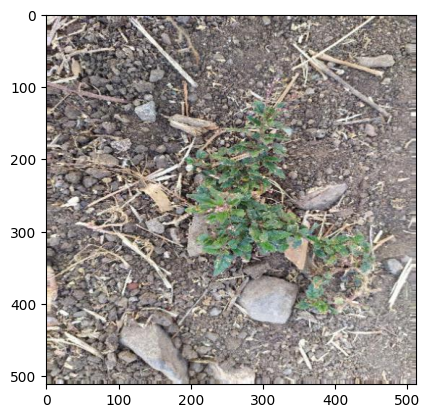

In [12]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img = plt.imread('/kaggle/working/data/agri_0_1009.jpeg')
plt.imshow(img)

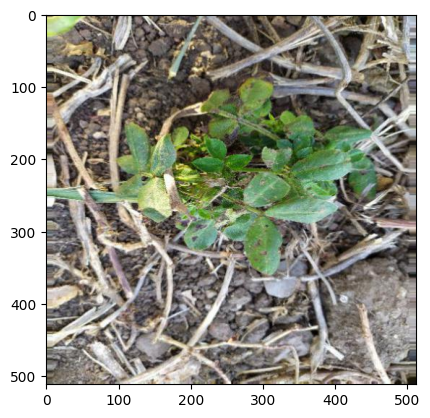

In [13]:
img2 = plt.imread('/kaggle/working/data/agri_0_6891.jpeg')
plt.imshow(img2)

* <h3 style='color:purple' >Afficher les Bibliothèques nécessaires </h3>

In [14]:
import os
import shutil
import math
import numpy as np
from ultralytics import YOLO

**Séparez l'image et le fichier texte dans le jeu de données. Dans le dossier contenant les images et les étiquettes, nous devons les séparer.**

In [15]:
def separate_files(srclocation,deslocation,type_ofImage):   
    if not os.path.exists("./"+deslocation):
        os.mkdir(deslocation)
    files = [t for t in os.listdir(srclocation) if type_ofImage in t.lower()]
    append_path=[]
    srclocation=srclocation+'/'
    for txt in files:
        temp = srclocation +(txt)
        append_path.append(temp)
    for image in append_path:
        newpath= deslocation+"/"
        shutil.move(image, newpath)

In [16]:
separate_files('/kaggle/working/data','images/','.jpeg')

In [17]:
separate_files('/kaggle/working/data','labels','.txt')

In [18]:
shutil.move('/kaggle/working/labels','/kaggle/working/data')
shutil.move('/kaggle/working/images','/kaggle/working/data')

'/kaggle/working/data/images'

* <h3 style='color:purple' >Diviser les dossiers </h3>

<div style="text-align: justify; font-weight:bold;">

Nous avons réparti les données pour l'entraînement, le test et la validation selon un ratio particulier. J'ai utilisé le package split-folders pour effectuer cette séparation selon le ratio spécifié.

Vous pouvez utiliser split-folders en tant que module Python ou en tant qu'interface en ligne de commande (CLI).

Si votre ensemble de données est équilibré (chaque classe a le même nombre d'échantillons), choisissez le ratio ; sinon, optez pour le mode fixe.
 </div>

In [19]:
!pip install split-folders

In [20]:
import splitfolders
splitfolders.ratio('/kaggle/working/data','output',seed=1337,ratio=(.7,.15,.15),group_prefix=None,move=False)

Copying files: 2600 files [00:00, 6400.85 files/s]


In [21]:
testImageCount = [f for f in os.listdir('/kaggle/working/output/test/images')]

In [22]:
len(testImageCount)

196

In [23]:
testLabelCount = [f for f in os.listdir('/kaggle/working/output/test/labels')]

In [24]:
len(testLabelCount)

196

In [25]:
model = YOLO("yolov8n.pt") #Load a pretrained model

100%|██████████| 6.23M/6.23M [00:00<00:00, 122MB/s]


* <h3 style='color:purple' >Détection d'objets avec un ensemble de données personnalisé </h3>

<div style="text-align: justify; font-weight:bold;">

Dans la détection d'objets avec un ensemble de données personnalisé, nous devons créer un fichier YAML. Si vous avez besoin de plus de détails sur le fichier YAML, les informations sont disponibles dans le fichier readme.md.
 </div>

In [26]:
custom={}

In [27]:
model.train(data='/kaggle/input/yaml-custom/custom.yaml', epochs=3)  # train the model

Ultralytics YOLOv8.0.227 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/input/yaml-custom/custom.yaml, epochs=3, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=Non

100%|██████████| 755k/755k [00:00<00:00, 20.2MB/s]
2023-12-14 10:55:54,627	INFO util.py:129 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2023-12-14 10:55:55,171	INFO util.py:129 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...
AMP: checks passed ✅


train: Scanning /kaggle/working/output/train/labels... 909 images, 0 backgrounds, 0 corrupt: 100%|██████████| 909/909 [00:00<00:00, 1134.77it/s]


train: New cache created: /kaggle/working/output/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/output/val/labels... 195 images, 0 backgrounds, 0 corrupt: 100%|██████████| 195/195 [00:00<00:00, 1318.53it/s]

val: New cache created: /kaggle/working/output/val/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/3      2.33G      1.406      2.412      1.707         39        640: 100%|██████████| 57/57 [00:13<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.53it/s]

                   all        195        316      0.684      0.526       0.54      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/3      2.35G      1.326      1.815      1.635         43        640: 100%|██████████| 57/57 [00:10<00:00,  5.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.16it/s]

                   all        195        316      0.405      0.547      0.423      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/3      2.35G      1.267      1.583      1.583         58        640: 100%|██████████| 57/57 [00:10<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.21it/s]

                   all        195        316      0.753      0.677      0.763      0.436



3 epochs completed in 0.013 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.0.227 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.88it/s]


                   all        195        316      0.752       0.68      0.763      0.436
                  crop        195        191      0.792      0.623      0.785      0.477
                  weed        195        125      0.712      0.736       0.74      0.396
Speed: 1.4ms preprocess, 1.9ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▁█▂
lr/pg1,▁█▂
lr/pg2,▁█▂
metrics/mAP50(B),▃▁█
metrics/mAP50-95(B),▃▁█
metrics/precision(B),▇▁█
metrics/recall(B),▁▂█
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▄▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fa8c072dcc0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [28]:
output_images = [t for t in os.listdir('/kaggle/working/runs/detect/train') if '.jpg' in t.lower()]

In [29]:
output_images

['val_batch2_labels.jpg',
 'labels.jpg',
 'train_batch0.jpg',
 'val_batch1_pred.jpg',
 'val_batch0_pred.jpg',
 'train_batch1.jpg',
 'labels_correlogram.jpg',
 'val_batch1_labels.jpg',
 'val_batch0_labels.jpg',
 'train_batch2.jpg',
 'val_batch2_pred.jpg']

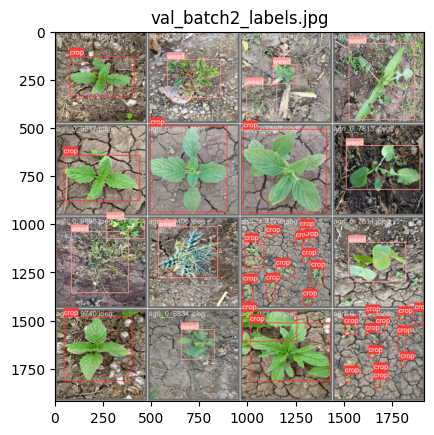

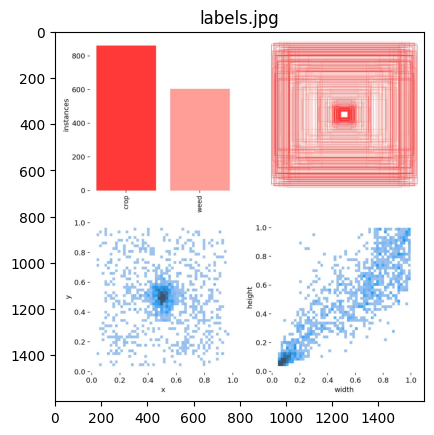

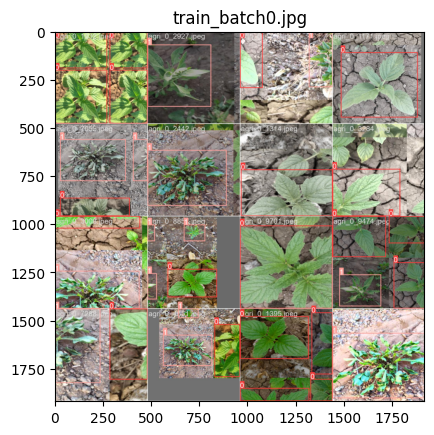

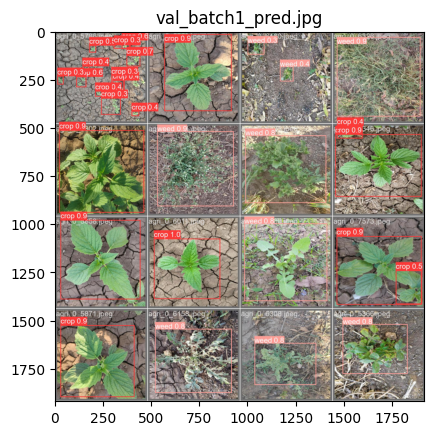

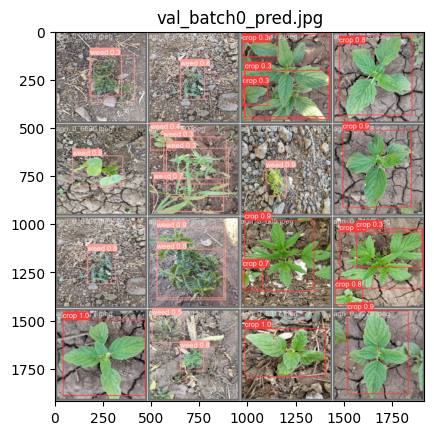

...

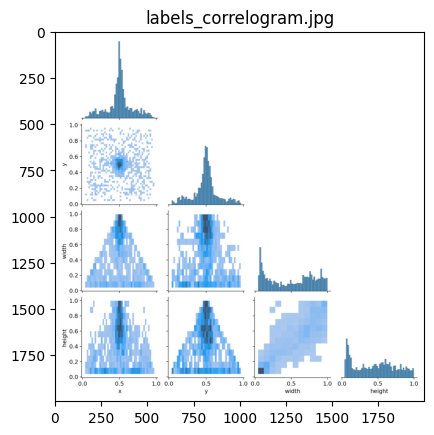

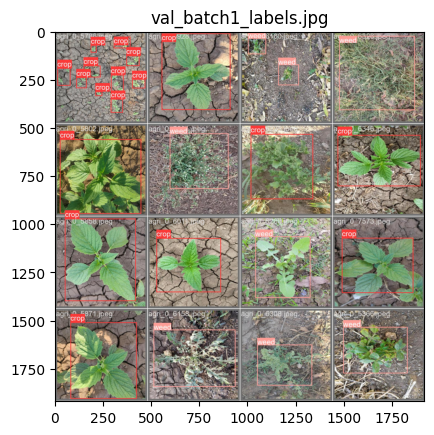

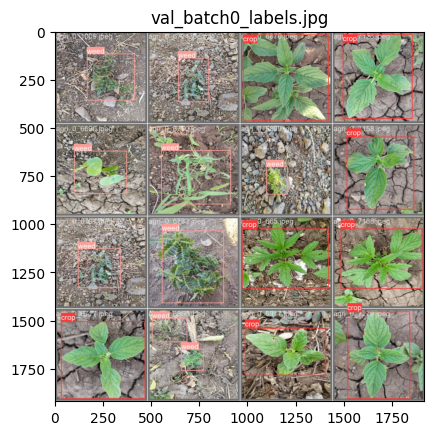

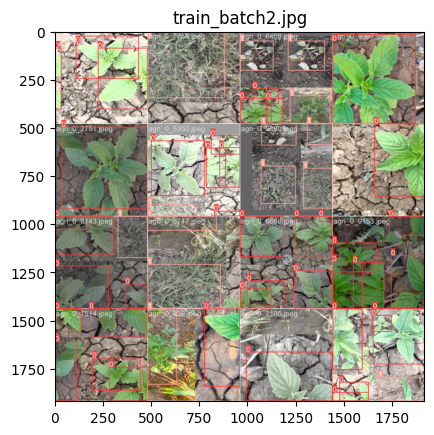

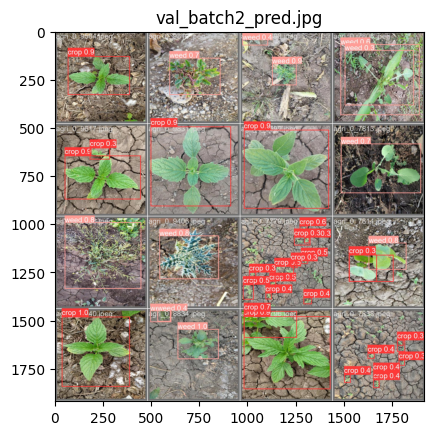

In [30]:
main_path = '/kaggle/working/runs/detect/train/'
for image in output_images:
    path=main_path +image
    tmp = plt.imread(path)
    plt.imshow(tmp)
    plt.title(image)
    plt.show()
  

**Plt the confusion matrix, F1 ,PR,P and R curve images**

In [31]:
matrix_images = [t for t in os.listdir('/kaggle/working/runs/detect/train') if '.png' in t.lower()]

In [32]:
matrix_images

['R_curve.png',
 'P_curve.png',
 'PR_curve.png',
 'confusion_matrix.png',
 'results.png',
 'F1_curve.png',
 'confusion_matrix_normalized.png']

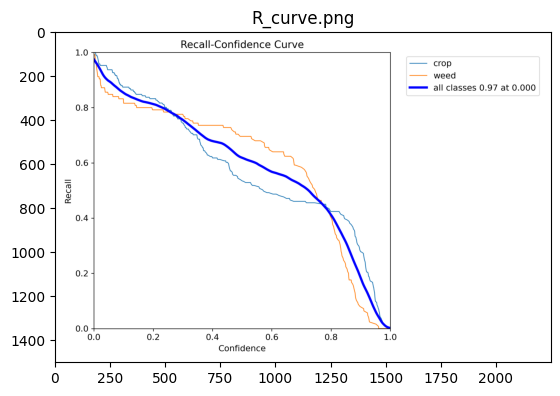

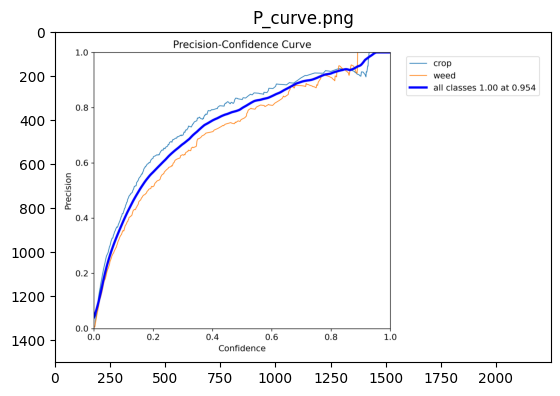

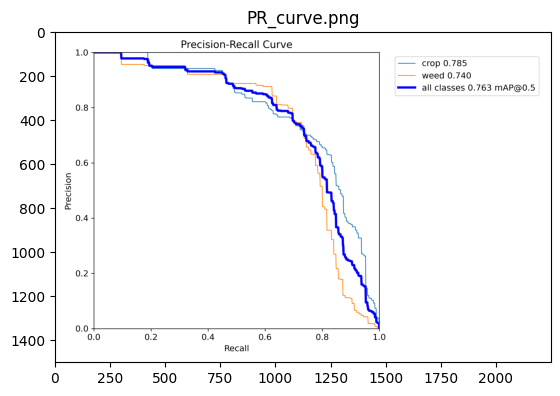

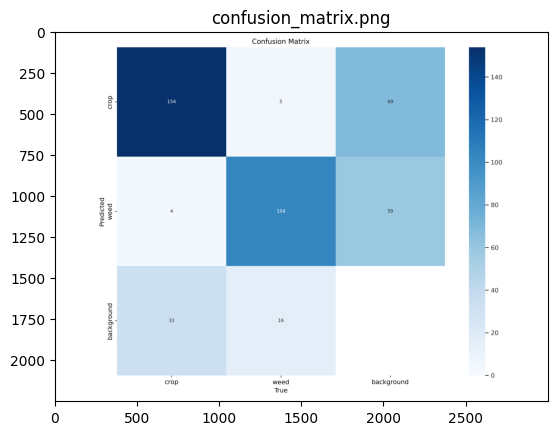

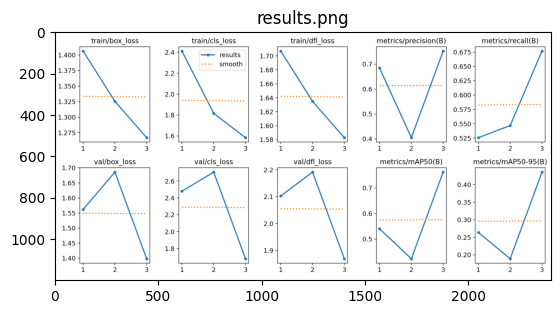

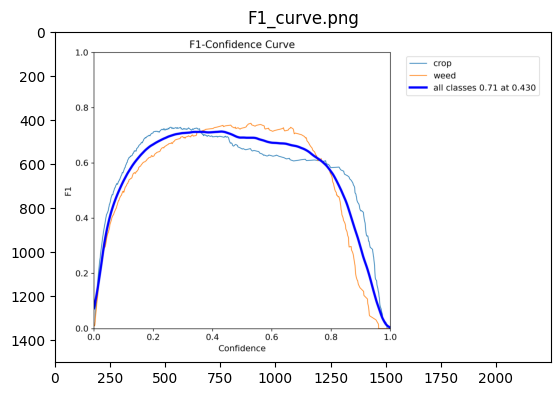

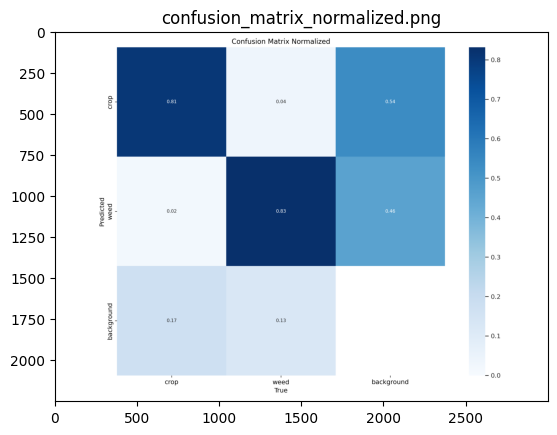

In [33]:
main_path = '/kaggle/working/runs/detect/train/'
for image in matrix_images:
    path=main_path +image
    tmp = plt.imread(path)
    plt.imshow(tmp)
    plt.title(image)
    plt.show()


* <h3 style='color:purple' >Utiliser notre model </h3>

<div style="text-align: justify; font-weight:bold;">

Une fois que le modèle est généré ou entraîné, notre modèle est enregistré dans le dossier runs/detect/train/weights (best.pt). Maintenant, nous pouvons déployer notre nouveau modèle. 
 </div>

In [34]:
model1  = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

In [35]:
model1.val() 

Ultralytics YOLOv8.0.227 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/working/output/val/labels.cache... 195 images, 0 backgrounds, 0 corrupt: 100%|██████████| 195/195 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.16it/s]


                   all        195        316      0.752      0.677      0.763      0.437
                  crop        195        191      0.792      0.619      0.785      0.478
                  weed        195        125      0.713      0.736       0.74      0.396
Speed: 1.3ms preprocess, 3.9ms inference, 0.0ms loss, 3.7ms postprocess per image
Results saved to runs/detect/val


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fa8c0d96a40>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [38]:
model1.predict(source='/kaggle/working/output/test/images',save=True)


image 1/196 /kaggle/working/output/test/images/agri_0_1026.jpeg: 640x640 1 crop, 6.0ms
image 2/196 /kaggle/working/output/test/images/agri_0_1146.jpeg: 640x640 3 weeds, 6.4ms
image 3/196 /kaggle/working/output/test/images/agri_0_1192.jpeg: 640x640 1 weed, 6.2ms
image 4/196 /kaggle/working/output/test/images/agri_0_1210.jpeg: 640x640 1 weed, 7.1ms
image 5/196 /kaggle/working/output/test/images/agri_0_1211.jpeg: 640x640 1 crop, 6.1ms
image 6/196 /kaggle/working/output/test/images/agri_0_1258.jpeg: 640x640 2 weeds, 5.9ms
image 7/196 /kaggle/working/output/test/images/agri_0_1332.jpeg: 640x640 4 crops, 5.9ms
image 8/196 /kaggle/working/output/test/images/agri_0_1334.jpeg: 640x640 1 weed, 5.8ms
image 9/196 /kaggle/working/output/test/images/agri_0_1420.jpeg: 640x640 2 weeds, 5.8ms
image 10/196 /kaggle/working/output/test/images/agri_0_1570.jpeg: 640x640 2 weeds, 5.7ms
image 11/196 /kaggle/working/output/test/images/agri_0_1612.jpeg: 640x640 1 weed, 5.9ms
image 12/196 /kaggle/working/output

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'crop', 1: 'weed'}
 orig_img: array([[[ 49,  65,  81],
         [ 56,  72,  88],
         [ 57,  73,  89],
         ...,
         [179, 207, 224],
         [179, 209, 226],
         [178, 208, 225]],
 
        [[ 98, 114, 130],
         [100, 116, 132],
         [ 98, 114, 130],
         ...,
         [146, 174, 191],
         [139, 169, 186],
         [134, 164, 181]],
 
        [[100, 116, 132],
         [101, 117, 133],
         [103, 119, 135],
         ...,
         [178, 205, 225],
         [182, 212, 231],
         [181, 211, 230]],
 
        ...,
 
        [[ 11,  11,  29],
         [  9,  11,  29],
         [  2,   5,  20],
         ...,
         [ 99, 112, 128],
         [ 98, 111, 127],
         [100, 113, 129]],
 
        [[ 23,  21,  40],
         [ 27,  27,  45],
         [ 26,  26,  42],
         ...,
         [  9,  22, 

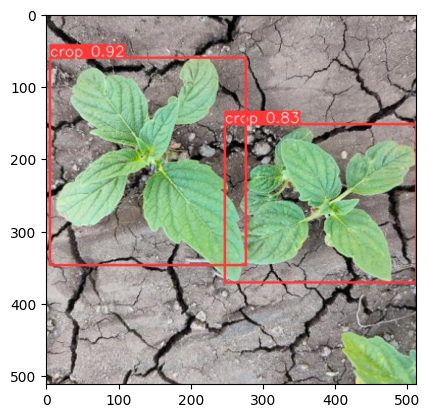

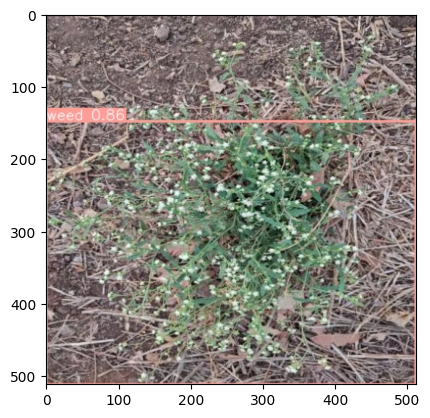

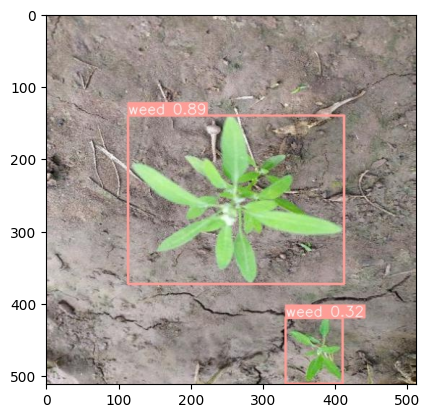

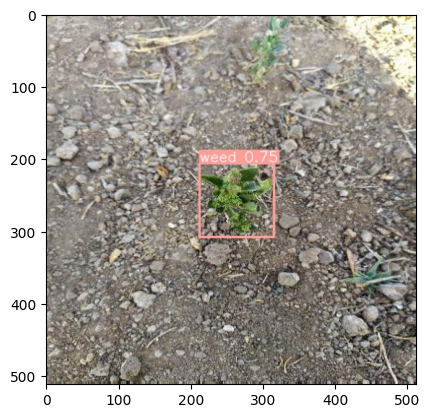

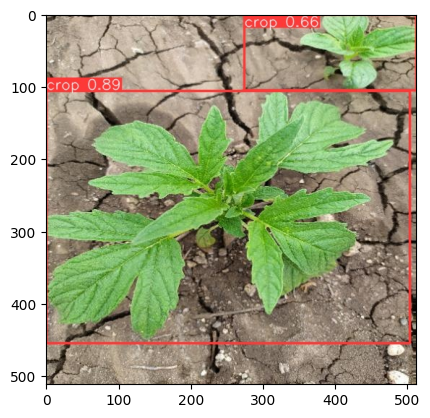

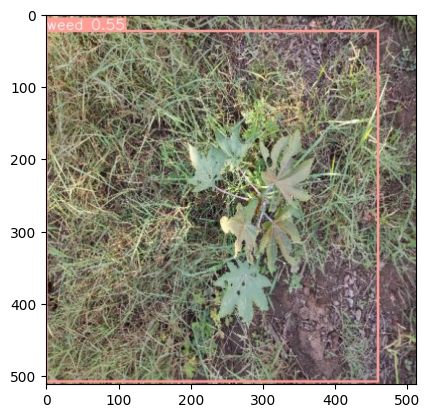

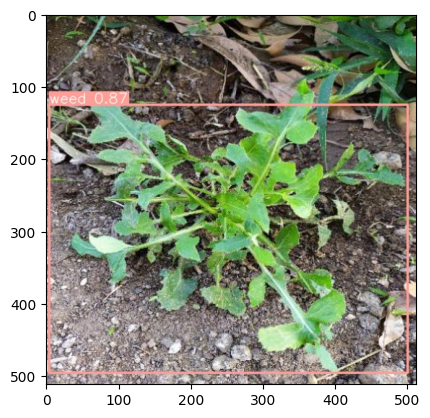

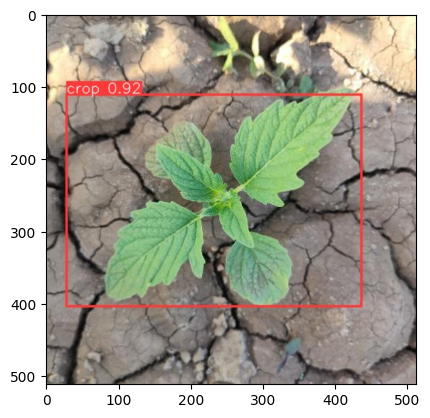

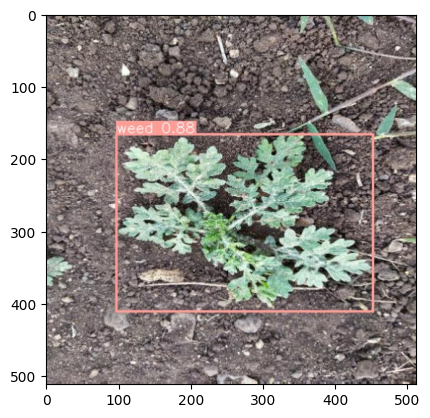

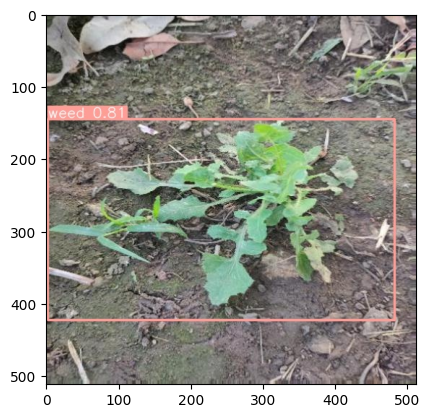

In [39]:
predicted_image = [t for t in os.listdir('/kaggle/working/runs/detect/predict') if '.jpeg' in t.lower()]
predict_path='/kaggle/working/runs/detect/predict/'
sample_image=predicted_image[10:20]
for image in sample_image:
    tmp=plt.imread(predict_path+image)
    plt.imshow(tmp)
    plt.grid(False)
    plt.show()

<h2 style='color:orangered' align='center'>Conclusion</h2>

---
<div style="text-align: justify; font-weight:bold;">
En récapitulant les points clés abordés dans ce notebook, nous avons exploré en profondeur l'algorithme de détection d'objets YOLO (You Only Look Once), mettant en lumière ses étapes fondamentales, ses versions évolutives, et ses avantages distinctifs.

L'importance de YOLO dans la détection d'objets transcende sa rapidité et sa précision. En tant que pionnier dans le domaine, YOLO a redéfini la norme en offrant une détection en temps réel sans compromettre la qualité. Son impact se ressent dans une variété d'applications, de la surveillance vidéo à la médecine, en passant par l'industrie automobile, où sa réactivité et sa polyvalence sont essentielles.

La polyvalence de YOLO se reflète dans ses différentes versions, chacune apportant des améliorations pour répondre aux besoins changeants des applications de détection d'objets. L'évolution continue de YOLO atteste de son engagement envers l'innovation et son adaptation aux défis émergents.

YOLO demeure un pilier dans le domaine de la vision par ordinateur, son impact s'étendant bien au-delà de la détection d'objets conventionnelle. Son rôle central dans des applications variées souligne son statut incontournable dans le paysage de l'intelligence artificielle, représentant une référence inégalée en termes d'efficacité et de performance.
</div>

---

<h2 style='color:orangered' align='center'>Références</h2>

---
<div style="text-align: justify; font-weight:bold;">
<ul>
<li><a href="https://docs.ultralytics.com/" style="color:brown;"> https://docs.ultralytics.com/ </a></li>
<li><a href="https://www.youtube.com/watch?v=ag3DLKsl2vk" style="color:brown;"> https://www.youtube.com/watch?v=ag3DLKsl2vk </a></li>
<li><a href="https://medium.com/@connect.vin/yat-an-open-source-data-annotation-tool-for-yolo-8bb75bce1767" style="color:brown;"> https://medium.com/@connect.vin/yat-an-open-source-data-annotation-tool-for-yolo-8bb75bce1767 </a></li>
<li><a href="https://pjreddie.com/darknet/yolo/" style="color:brown;"> https://pjreddie.com/darknet/yolo/ </a></li>
    
</ul>
</div>

---

<h2 style='color:olive' align='center'>Fin</h2>